In [1]:
from IPython.display import display, Image

In [2]:
from traitlets.config.manager import BaseJSONConfigManager
from pathlib import Path
path = Path.home() / ".jupyter" / "nbconfig"
cm = BaseJSONConfigManager(config_dir=str(path))
tmp = cm.update(
        "rise",
        {
            "theme": "",
            "transition": "fade",
            "start_slideshow_at": "selected",
            "autolaunch": False,
            "width": "100%",
            "height": "100%",
            "backimage": "fondo.jpeg",
            "header": "",
            "footer":"",
            "scroll": True,
            "enable_chalkboard": False,
            "slideNumber": True,
            "center": True,
            "controlsLayout": "edges",
            "slideNumber": True,
            "hash": True,
        }
    )


<h1 align="center">Proyecto Final</h1> 


##### Nombres:  
 Andrés Montecinos
     
 Pedro Paillalef 

##### Curso:  
 Aplicaciones Matemáticas en Ingenieria


In [3]:
####MODIFICAR POSIBLEMENTE AGREGAR A .PY
#### librerías
import pandas as pd 
import numpy as np 


<h1 align="center">Contenidos de la presentación</h1> 

***
    
* Introducción

    * Problema necesidad                                              
    
* Base de Datos   
    
* Procesamiento de datos
    
* Metodología
    
* Resultados



<h1 align="center">Introducción</h1> 

***  

A diario nos vemos invadido por recomendaciones en cada una de las plataformas que 

visitamos, ya sea en youtube con lista de reproducción automática, spotify con los más 

escuchados en Chile y netflix recomendado peliculas para ti. Esto es posible gracias a los 

**sistemas de recomendación**


<p align="center">
  <img src="imagenes\siste.jpeg" width="1400" height="1400" align="center"/>
</p>


<p align="center">
  <img src="imagenes\recome1.jpeg" width="1200" height="1000" align="center"/>
</p>


<p align="center">
  <img src="recome2.jpeg" width="1200" height="1000" align="center"/>
</p>


.

*** 
### Objetivo

**Incentivar** la visualización de contenido, para incrementar la **rentabilidad** de 

plataformas cómo: Amazon Prime, Netflix, sitios de compras, etc. 


### Desafío

**Adaptarse** a  los gustos del usuario y de la masa, para poder sugerir el  contenido adecuado. 

<h1 align="center">Filtros de recomendación</h1> 

***  

.

.


***
*Los sistemas de recomendación, a veces llamados en inglés “recommender systems” son*

*algoritmos que intentan “predecir” los siguientes ítems (productos, canciones, etc.) que* 

*querrá adquirir un usuario en particular.*

<p align="center">
  <img src="imagenes\quever.jpeg" width="700" height="500" align="center"/>
</p>



<h1 align="center">Tipos de filtros de recomendación</h1> 

*** 
<p align="center">
  <img src="imagenes\tipo_filtro.jpeg" width="1200" height="1000" align="center"/>
</p>

.

.

.


***

**Filtro demográfico:**
* Aconseja a partir de los gustos de la masa. Considerando varibles como **popularidad**, **votos promedio**, etc. Se ofrecerán a todos los usuarios por igual sin aprovechar la personalización.

**Filtro basado en contenido:**
* A partir de las **caracteristicas** de un producto se intenta “adivinar” qué busca el usuario y ofrecer **contenidos similares**.

**Filtro colaborativo:**
* Es el más novedoso, pues utiliza la información de “masas” para identificar perfiles similares y aprender de los datos para recomendar productos de manera individual.

<h1 align="center">Objetivo de este trabajo</h1> 

***  

<h1 align="center">Objetivo de este trabajo</h1> 

***  



Desarrollar un sistema de recomendación de películas aplicando los 3 tipos de filtros 

revisados con anterioridad.




<p align="center">
  <img src="imagenes\esquema.jpeg" width="1200" height="850" align="center"/>
</p>

<h1 align="center">Base de Datos</h1> 

***  
* Está compuesta el conjunto de datos de peliculas TMDB 5000. La cual es entregada en 2 archivos:

  *  **tmdb_5000_credits.csv** : id_movies, cast, crew, title.
  
  *  **tmdb_5000_movies.csv**  : id, budget, popularity, genres, etc.
 
* Esta base de datos la componen **4083 films** y **23 variables**.


* Algunas variables de interés para la **recomendación** son las siguientes 
   1. Genres
   2. Keywords
   3. Overwiew
   4. Popularity
   5. vote_average
   6. vote_count


In [4]:
pd.set_option('display.max_columns', 500)  # Ver más columnas de los dataframes

In [5]:

### LECTURA DE DOCUMENTOS
df1=pd.read_csv('data/tmdb_5000_credits.csv')
df2=pd.read_csv('data/tmdb_5000_movies.csv')

***
.

.

.

Datos tmdb_5000_credits.csv se puede ver como sigue

In [6]:
df1.head(3)


,movie_id,title,cast,crew
0,19995,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,285,Pirates of the Caribbean: At World's End,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,206647,Spectre,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."



Mientras que tmdb_5000_movies.csv puede verse como 

In [7]:
df2.head(3)


,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466


<h1 align="center">Base de Datos</h1> 

***  
Un resumen detallado acerca de las variables que componen los datos son identificadas como

sigue:

* tipo de dato
* descripción de la variable
* Cantidad total de datos
* únicos 
* vacios

In [8]:
from lectura import *
a=tabla_descripcion(df2,descripcion_movies(2))
a=a.merge(resumen_por_columnas(df2),on='Variable')
a

,Variable,Tipo de Dato,Descripción,total_datos,total_no_nulos,unicos,vacios
0,budget,int64,El presupuesto en el que se realizó la película.,4803,4803,436,0
1,genres,object,"El género de la película, acción, comedia, sus...",4803,4775,1175,28
2,homepage,object,Un enlace a la página de inicio de la película.,4803,1712,1691,3091
3,id,int64,Es el código de identificación de la película.,4803,4803,4803,0
4,keywords,object,Las palabras clave o etiquetas relacionadas co...,4803,4391,4222,412
5,original_language,object,El idioma en el que se hizo la película.,4803,4803,37,0
6,original_title,object,El título de la película antes de la traducció...,4803,4803,4801,0
7,overview,object,Una breve descripción de la película.,4803,4800,4800,3
8,popularity,float64,Una cantidad numérica que especifica la popula...,4803,4803,4802,0
9,production_companies,object,La casa productora de la película.,4803,4452,3697,351


***

En la tabla, se pueden observan los siguientes problemas:
  1. hay valores **vacíos** en algunas variables (Ej: genres, keywords,etc)
  
  

In [9]:
#Overview
df2[df2['overview'].isnull()]


,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
2656,15000000,"[{""id"": 18, ""name"": ""Drama""}]",NaN,370980,"[{""id"": 717, ""name"": ""pope""}, {""id"": 5565, ""na...",it,Chiamatemi Francesco - Il Papa della gente,NaN,0.738646,"[{""name"": ""Taodue Film"", ""id"": 45724}]","[{""iso_3166_1"": ""IT"", ""name"": ""Italy""}]",2015-12-03,0,NaN,"[{""iso_639_1"": ""es"", ""name"": ""Espa\u00f1ol""}]",Released,NaN,Chiamatemi Francesco - Il Papa della gente,7.3,12
4140,2,"[{""id"": 99, ""name"": ""Documentary""}]",NaN,459488,"[{""id"": 6027, ""name"": ""music""}, {""id"": 225822,...",en,"To Be Frank, Sinatra at 100",NaN,0.050625,"[{""name"": ""Eyeline Entertainment"", ""id"": 60343}]","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""}]",2015-12-12,0,NaN,[],Released,NaN,"To Be Frank, Sinatra at 100",0.0,0
4431,913000,"[{""id"": 99, ""name"": ""Documentary""}]",NaN,292539,[],de,Food Chains,NaN,0.795698,[],[],2014-04-26,0,83.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,NaN,Food Chains,7.4,8



* *overview, realese_data y run_time*. Se pueden completar los elementos vacíos buscando la información faltante.

   2. **peliculas repetidas** (únicos variable original_title)

In [10]:
df2['original_title'].value_counts()


Batman                             2
Out of the Blue                    2
A Man Apart                        1
The Mask                           1
Dom Hemingway                      1
                                  ..
Diary of a Mad Black Woman         1
The Secret Life of Walter Mitty    1
RED 2                              1
Love Stinks                        1
The Homesman                       1
Name: original_title, Length: 4801, dtype: int64

* El problema con la variable *original_title* no es relevante porque se puede atribuír a remasterizaciones de películas  que comparten el mismo nombre




<h1 align="center">Procesamiento de Base de Datos</h1> 

***  

<p align="center">
  <img src="imagenes\etapa.jpeg" width="1200" height="850" align="center"/>
</p>

<h1 align="center">Preprocesamiento de Datos</h1> 

***  


<p align="center">
  <img src="imagenes\etapa1.jpeg" width="1200" height="850" align="center"/>
</p>

<h1 align="center">Integrar Información</h1> 

***  

* **Integrar información de 2 bases de Datos.**:
    
    * Dos DataFrame comparten el código de identificación de la peliculas (movie_id, id).Por lo tanto se modifica movie_id a id
    y se unen las tablas por la llave id.
    

In [11]:
### cambiar nombre de tabla tmdb_5000_credits.csv (df1)
df1.columns=['id','title','cast','crew']
#### Unir tablas
tabla_unida=df2.merge(df1.drop(['title'],axis=1),on='id')
tabla_unida.tail(2)


,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,cast,crew
4801,0,[],http://shanghaicalling.com/,126186,[],en,Shanghai Calling,When ambitious New York attorney Sam is sent t...,0.857008,[],"[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-05-03,0,98.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,A New Yorker in Shanghai,Shanghai Calling,5.7,7,"[{""cast_id"": 3, ""character"": ""Sam"", ""credit_id...","[{""credit_id"": ""52fe4ad9c3a368484e16a36b"", ""de..."
4802,0,"[{""id"": 99, ""name"": ""Documentary""}]",NaN,25975,"[{""id"": 1523, ""name"": ""obsession""}, {""id"": 224...",en,My Date with Drew,Ever since the second grade when he first saw ...,1.929883,"[{""name"": ""rusty bear entertainment"", ""id"": 87...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2005-08-05,0,90.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,NaN,My Date with Drew,6.3,16,"[{""cast_id"": 3, ""character"": ""Herself"", ""credi...","[{""credit_id"": ""58ce021b9251415a390165d9"", ""de..."


<h1 align="center">Completar Datos Vacios</h1> 

***  


<p align="center">
  <img src="imagenes\etapa2.jpeg" width="1200" height="850" align="center"/>
</p>

<h1 align="center">Completar Datos Vacios</h1> 

***  

* Tomando en cuanta las variables de interés para posibles filtros colaborativos se procede a completar dichas varibles:
    
    Para la variable overview, se buscan los valores vacíos o NaN
    

    
    

In [12]:
tabla_unida[tabla_unida['overview'].isnull()]


,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,cast,crew
2656,15000000,"[{""id"": 18, ""name"": ""Drama""}]",NaN,370980,"[{""id"": 717, ""name"": ""pope""}, {""id"": 5565, ""na...",it,Chiamatemi Francesco - Il Papa della gente,NaN,0.738646,"[{""name"": ""Taodue Film"", ""id"": 45724}]","[{""iso_3166_1"": ""IT"", ""name"": ""Italy""}]",2015-12-03,0,NaN,"[{""iso_639_1"": ""es"", ""name"": ""Espa\u00f1ol""}]",Released,NaN,Chiamatemi Francesco - Il Papa della gente,7.3,12,"[{""cast_id"": 5, ""character"": ""Jorge Mario Berg...","[{""credit_id"": ""5660019ac3a36875f100252b"", ""de..."
4140,2,"[{""id"": 99, ""name"": ""Documentary""}]",NaN,459488,"[{""id"": 6027, ""name"": ""music""}, {""id"": 225822,...",en,"To Be Frank, Sinatra at 100",NaN,0.050625,"[{""name"": ""Eyeline Entertainment"", ""id"": 60343}]","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""}]",2015-12-12,0,NaN,[],Released,NaN,"To Be Frank, Sinatra at 100",0.0,0,"[{""cast_id"": 0, ""character"": ""Narrator"", ""cred...","[{""credit_id"": ""592b25e4c3a368783e065a2f"", ""de..."
4431,913000,"[{""id"": 99, ""name"": ""Documentary""}]",NaN,292539,[],de,Food Chains,NaN,0.795698,[],[],2014-04-26,0,83.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,NaN,Food Chains,7.4,8,[],"[{""credit_id"": ""5470c3b1c3a368085e000abd"", ""de..."


Películas a completar columna **overview**:
   * Chiamatemi Francesco - Il Papa della gente
   * To Be Frank, Sinatra at 100
   * Food Chains


In [13]:
#completar overview
tabla_unida.loc[tabla_unida['original_title']=='Chiamatemi Francesco - Il Papa della gente','overview'] = 'A biopic of the rise of father Jorge Mario Bergoglio SJ from a teacher in a Jesuit High School in Argentina to archbishop and cardinal of Buenos Aires to Pope of the Roman Catholic Church.' 
tabla_unida.loc[tabla_unida['original_title']=='To Be Frank, Sinatra at 100','overview']= 'The life of Frank Sinatra, as an actor and singer and the steps along the way that led him to become such an icon.'
tabla_unida.loc[tabla_unida['original_title']=='Food Chains','overview']='There is so much interest in food these days yet there is almost no interest in the hands that pick that food. In the US, farm labor has always been one of the most difficult and poorly paid jobs and has relied on some of the nations most vulnerable people.'


    
* *adicionalmente se completa la columna release_date,runtime de las cuales se dispone información.

In [14]:
#completar release_date
tabla_unida.loc[tabla_unida['original_title']=='America Is Still the Place','release_date'] ='2014-01-11'
#completar runtime
tabla_unida.loc[tabla_unida['original_title']=='Chiamatemi Francesco - Il Papa della gente','runtime'] = 98
tabla_unida.loc[tabla_unida['original_title']=='To Be Frank, Sinatra at 100','runtime']= 81


<h1 align="center">Convertir de Cadena de datos a Listas</h1> 

***  


<p align="center">
  <img src="imagenes\etapa3.jpeg" width="1200" height="850" align="center"/>
</p>

<h1 align="center">Convertir de Cadena de datos a Listas</h1> 

***  

* Dado que el DataFrame creado por nombre 'tabla_unida' posee información en columnas guardada como cadena, procedemos a convertir estas cadenas a lista. De esta manera, dichas columnas quedan util para el modelo de contenidos a usar , en la matriz idf-id.
    

    

In [15]:
tabla_unida.head(2)


,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,cast,crew
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."


In [16]:
from preprocesamiento import *
#### Mostrar tablas medias resumidas
# Parse the stringified features into their corresponding python objects
from ast import literal_eval

features = ['cast', 'keywords', 'genres','crew','spoken_languages','production_countries','production_companies']
for feature in features:
    tabla_unida[feature] = tabla_unida[feature].apply(literal_eval)




In [17]:
for feature in features:
    tabla_unida[feature] = tabla_unida[feature].apply(get_list)
tabla_unida.head(2)

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,cast,crew
0,237000000,"[Action, Adventure, Fantasy, Science Fiction]",http://www.avatarmovie.com/,19995,"[culture clash, future, space war, space colony]",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[Ingenious Film Partners, Twentieth Century Fo...","[United States of America, United Kingdom]",2009-12-10,2787965087,162.0,"[English, Español]",Released,Enter the World of Pandora.,Avatar,7.2,11800,"[Sam Worthington, Zoe Saldana, Sigourney Weave...","[Stephen E. Rivkin, Rick Carter, Christopher B..."
1,300000000,"[Adventure, Fantasy, Action]",http://disney.go.com/disneypictures/pirates/,285,"[ocean, drug abuse, exotic island, east india ...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[Walt Disney Pictures, Jerry Bruckheimer Films...",[United States of America],2007-05-19,961000000,169.0,[English],Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500,"[Johnny Depp, Orlando Bloom, Keira Knightley, ...","[Dariusz Wolski, Gore Verbinski, Jerry Bruckhe..."


<h1 align="center">Crear Nuevas Variables</h1> 

***  


<p align="center">
  <img src="imagenes\etapa4.jpeg" width="1200" height="850" align="center"/>
</p>

<h1 align="center">Crear Nuevas Variables</h1> 

***  

* Para el análisis de datos es importante estimar a partir de las columnas conocidas otras variables como por ejemplo, **utilidad**, dado que es importante comprender la rentabilidad de películas y estas a su vez asociarla al gero u otra variables que pudiese ser explicativa.
    



**A continuación algunas de las variables creadas:**

*  **Predominant_genre** : Género predominante de la película (primero de la lista genres).

*  **Decade** : Para identificar la decada en que se filmo.

*  **profitableness_MUS\$\_average**: utilidad de la pelicula


In [18]:
import datetime
#Crea columna con el año de producción de la pelicula
tabla_unida['release_date']=pd.to_datetime(tabla_unida['release_date'])
tabla_unida['release_year']=tabla_unida['release_date'].dt.year
#Crea columna con la decada de la pelicula
tabla_unida['Decade']=redondear(tabla_unida['release_year'],-1)
#Crea columna con utilidad de la pelicula
tabla_unida['profitableness_MUS$']=(tabla_unida['revenue']-tabla_unida['budget'])/1000000
#Crear Columna Genero Predominante
tabla_unida['Predominant_genre']=descomponer(tabla_unida)


In [19]:
tabla_unida.head(2)


,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count,cast,crew,release_year,Decade,profitableness_MUS$,Predominant_genre
0,237000000,"[Action, Adventure, Fantasy, Science Fiction]",http://www.avatarmovie.com/,19995,"[culture clash, future, space war, space colony]",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[Ingenious Film Partners, Twentieth Century Fo...","[United States of America, United Kingdom]",2009-12-10,2787965087,162.0,"[English, Español]",Released,Enter the World of Pandora.,Avatar,7.2,11800,"[Sam Worthington, Zoe Saldana, Sigourney Weave...","[Stephen E. Rivkin, Rick Carter, Christopher B...",2009,2000,2550.965087,Action
1,300000000,"[Adventure, Fantasy, Action]",http://disney.go.com/disneypictures/pirates/,285,"[ocean, drug abuse, exotic island, east india ...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[Walt Disney Pictures, Jerry Bruckheimer Films...",[United States of America],2007-05-19,961000000,169.0,[English],Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500,"[Johnny Depp, Orlando Bloom, Keira Knightley, ...","[Dariusz Wolski, Gore Verbinski, Jerry Bruckhe...",2007,2000,661.000000,Adventure


.

.

.


.

Para encontrar relaciones resulta pertinente analizar tanto popularidad promedio, ingresos 

promedio y otras variables  **por género** de la película.


*  **# Films** : Cantidad de películas asociadas por género

*  **vote_average**: calificación promedio recibida

*  **profitableness_MUS$_average**:

In [20]:
#Datos Por Género de Pelicula
grupo = tabla_unida.groupby('Predominant_genre')  
#Cantidad de Peliculas
tabla_n_peliculas=grupo[['original_title']].count().reset_index().sort_values('original_title')
#Utilidad
tabla_utilidad=grupo[['profitableness_MUS$']].mean().reset_index().sort_values('profitableness_MUS$')
#Popularidad Promedio
tabla_popularidad=grupo[['vote_count']].count().reset_index().sort_values('vote_count')
tabla_popularidad['vote_count']=tabla_popularidad['vote_count']/100
#Voto Promedio
tabla_votos=grupo[['vote_average']].mean().reset_index().sort_values('vote_average')

tabla_por_genero=pd.merge(tabla_n_peliculas, tabla_utilidad,on='Predominant_genre')
tabla_por_genero=pd.merge(tabla_por_genero,tabla_popularidad,on='Predominant_genre')
tabla_por_genero=pd.merge(tabla_por_genero,tabla_votos,on='Predominant_genre')
tabla_por_genero.columns=['Predominant_genre','# Films', 'profitableness_MUS$_average','vote_count/10','vote_average']



In [21]:
tabla_por_genero.head(124)


,Predominant_genre,# Films,profitableness_MUS$_average,vote_count/10,vote_average
0,Foreign,2,-0.056850,0.02,7.200000
1,TV Movie,4,-0.250000,0.04,4.875000
2,War,24,28.164977,0.24,6.595833
3,History,25,48.372617,0.25,6.628000
4,Western,27,26.387970,0.27,6.414815
5,NaN,28,-0.072403,0.28,2.335714
6,Music,34,16.189963,0.34,6.252941
7,Mystery,41,46.914567,0.41,6.143902
8,Family,56,116.724018,0.56,5.646429
9,Documentary,89,6.794624,0.89,6.178652


***
la variable utilidad presenta gran variabilidad resultando pertienente hacer **estadística** 

**descriptivay visualización**

<h1 align="center">Análisis de variables</h1> 

***  

* Para compreder ciertas relaciones de datos se realiza estadística descriptiva con la base de datos modifica y se analizan gráficos de las variables estudiadas
    

In [22]:
tabla_unida.describe()


,budget,id,popularity,revenue,runtime,vote_average,vote_count,release_year,Decade,profitableness_MUS$
count,4.803000e+03,4803.000000,4803.000000,4.803000e+03,4803.000000,4803.000000,4803.000000,4803.000000,4803.000000,4803.000000
mean,2.904504e+07,57165.484281,21.492301,8.226064e+07,106.868624,6.092172,690.217989,2002.471164,1998.065792,53.215599
std,4.072239e+07,88694.614033,31.816650,1.628571e+08,22.610670,1.194612,1234.585891,12.414176,12.843621,135.967700
min,0.000000e+00,5.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1916.000000,1910.000000,-165.710090
25%,7.900000e+05,9014.500000,4.668070,0.000000e+00,94.000000,5.600000,54.000000,1999.000000,1990.000000,-0.799538
50%,1.500000e+07,14629.000000,12.921594,1.917000e+07,103.000000,6.200000,235.000000,2005.000000,2000.000000,2.511317
75%,4.000000e+07,58610.500000,28.313505,9.291719e+07,117.500000,6.800000,737.000000,2011.000000,2010.000000,55.312860
max,3.800000e+08,459488.000000,875.581305,2.787965e+09,338.000000,10.000000,13752.000000,2017.000000,2010.000000,2550.965087


* varibles **'budget'** y **'revenue'** con al desviación estandar, presencia de outlier.
* variable 'id' no aporta información


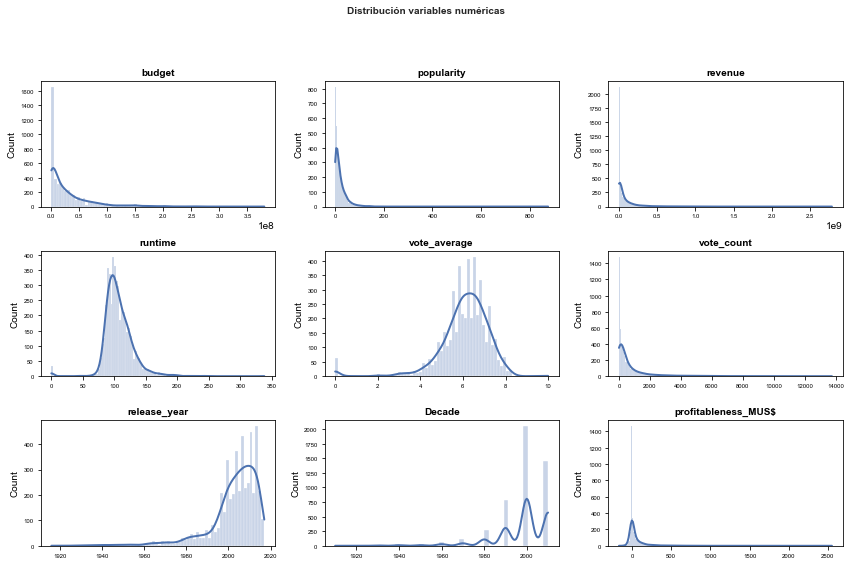

In [23]:
from graficos import * 

imagen_distribucion=graficar_distribucion(3,3,tabla_unida)


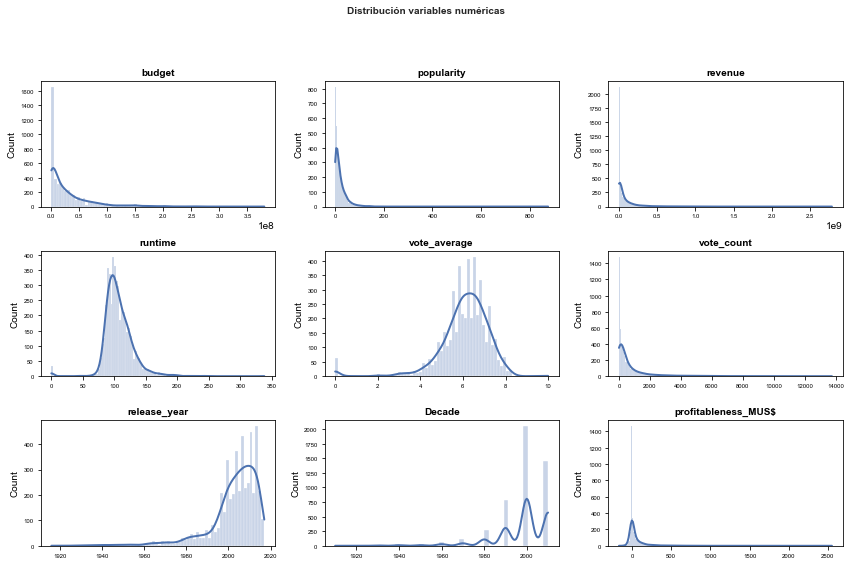

In [24]:
imagen_distribucion


<h1 align="center">Vizualización por género</h1> 

***  

* Algunas relaciones por género,presupuesto e ingresos 
    

In [25]:
grafico_altair_doble(tabla_unida)


alt.VConcatChart(...)

<h1 align="center">Vizualización por género</h1> 

***  

* Relaciones utilidad,presupuesto-ingreso
    

In [26]:
grafico_scatter_doble(tabla_unida)


alt.HConcatChart(...)

<h1 align="center">Vizualización por género</h1> 

***  

* Algunas relaciones por género,voto promedio y cantidad de voto.
    

In [27]:
grafico_voto_altair(tabla_por_genero)

alt.LayerChart(...)

<h1 align="center">Vizualización por género</h1> 

***  

* Algunas relaciones por género
    

In [28]:
grafico_vot(tabla_unida)


alt.Chart(...)

<h1 align="center">Aplicación de Filtros</h1> 

***  


    

<h1 align="center">Filtro Demográfico</h1> 

***  
Consiste en dar una recomendación por **popularidad** 

<p align="center">
  <img src="imagenes\filtro_demografico.jpeg" width="1200" height="850" align="center"/>
</p>

***
### Metodología


1. Se calcula una variable score
$$score= \frac{vR}{v+m}+\frac{mC}{v+m}$$

Donde:  
* v es el número de votos
* m es el número de votos mínimos para ser recomendada
* R es la calificación promedio (average rating)
* C es el voto medio

<h1 align="center">Filtro Demográfico</h1> 

***  


.
En ocasiones una recomendación de los mejores evaluados es suficiente para satisfacer las 

necesidades de los usuario. En este caso presentamos una recomendación dirigida de los  

mejores evaluados según alguna categoria en particular como género o decada en que se 

proyecto, simil a lo que hace netflix o amazon.

In [29]:
from modelos import *

<p align="center">
  <img src="imagenes\populares.jpeg" width="1200" height="850" align="center"/>
</p>

### Filtro demográfico desarrollado

In [30]:

filtro_demografico(tabla_unida,'Decade',2010,6)


,title,vote_count,vote_average,score
96,Inception,13752,8.1,7.733798
95,Interstellar,10867,8.1,7.655797
94,Guardians of the Galaxy,9742,7.9,7.458679
287,Django Unchained,10099,7.8,7.391967
77,Inside Out,6560,8.0,7.377675
3865,Whiplash,4254,8.3,7.354754


## Observaciones del filtro demográfico


- **Algoritmo rápido** de procesar

- Puede sugerir películas que compartan ciertas carácteristicas modificables (genéro, década, etc.)

- No hace recomendaciones para **usuarios objetivos**

- No considera el contenido para hacer recomendaciones

<h1 align="center">Filtro Basado en Contenido</h1> 

***  


En este filtro se utiliza un conjuto de palabras de la base de datos que generan una matriz 

de frecuencia que analiza la ocurrencia de una palabra respecto a la masa. 

Para elaborar este filtro nos basamos en analizar el conjuto de palabras de la reseña de 

cada pelicula, almacenada en la variable 'overview'.

<p align="center">
  <img src="imagenes\filtro_contenido.jpeg" width="700" height="500" align="center"/>
</p>

***
### Metodología

* Extraer las palabras de interés de la columna overview (eliminando conectores, etc.)

* Calcular la matriz de frecuencia (CountVectorizer())

* Realizar el producto matriz con matriz para obtener la similitud 

* La matriz resultante tiene la diagonal con valores “1” porque una película similar consigo misma




<p align="center">
  <img src="imagenes\matriz_coseno.jpeg" width="700" height="500" align="center"/>
</p>

### Filtro demográfico desarrollado

In [31]:
filtro_basado_contenido('The Dark Knight Rises',df2,4)


65      The Dark Knight
299      Batman Forever
428      Batman Returns
1359             Batman
Name: title, dtype: object

<h1 align="center">Filtro Colaborativo</h1> 

***  

Utiliza la información de “masas” para identificar perfiles similares y aprender de los 

datos para recomendar productos de manera individual.

<p align="center">
  <img src="imagenes\filtro_colaborativo.jpeg" width="800" height="650" align="center"/>
</p>

<h1 align="center">Tipos de filtros colaborativos</h1> 

***  


**Filtro Colaborativo Basado en el Usuario**: (Este es el que veremos a continuación)
* Se identifican usuarios similares
* Se recomiendan nuevos ítems a otros usuarios basado en el rating dado por otros usuarios similares (que no haya valorado este usuario)

**Fltro Colaborativo Basado en Items**:
* Calcular la similitud entre items
* Encontrar los “mejores items similares” a los que un usuario no tenga evaluados y recomendárselos

<p align="center">
 
<img src="imagenes\Collaborative_filter.png" width="600" height="600">
 
</p>

<h1 align="center">Filtro Colaborativo -Base de Datos</h1> 

***  

Para poder trabajar con un filtro colaborativo es importante conocer información relevante 

sobre el **usuario** y **sus preferencias**. 

Por ende, se escoge una base de datos externas con datos acerca de identificación del 

usuario, pelicula que ve y rating asignado. A continuación se muestra la base de datos de 

**TMDB 'ratings_small.csv'**

Sobre la base de dato se tiene que:
* el número de usuarios es : 670
* el número de peliculas es : 857
* el número total de votos : 18571
* los datos de rating varía entre 0 y 5.0


In [32]:
usuarios=pd.read_csv('data/ratings_small.csv')
dato_usuarios=usuarios[['userId','movieId','rating']]
dato_usuarios.columns=['user_id','id','rating_5']
df_peli=tabla_unida[['id','original_title']]
base_dato_usuario=dato_usuarios.merge(df_peli,on='id')


In [33]:
base_dato_usuario.head()


,user_id,id,rating_5,original_title
0,1,2105,4.0,American Pie
1,4,2105,4.0,American Pie
2,15,2105,4.0,American Pie
3,30,2105,2.0,American Pie
4,34,2105,4.0,American Pie


In [34]:
n_users = base_dato_usuario['user_id'].unique().shape[0]
n_items = base_dato_usuario['id'].unique().shape[0]
n_votos=base_dato_usuario.shape[0]
print('el número de usuarios es :',n_users) 
print('el número de peliculas es :',n_items)
print('el número total de votos :',n_votos)
print('los datos de rating varía entre',base_dato_usuario['rating_5'].min(), 'y',base_dato_usuario['rating_5'].max() )


el número de usuarios es : 670
el número de peliculas es : 857
el número total de votos : 18571
los datos de rating varía entre 0.5 y 5.0


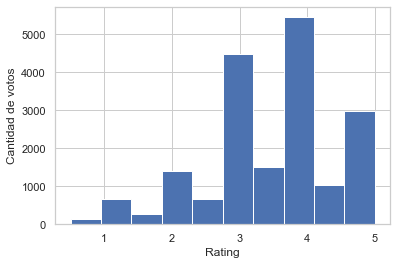

In [35]:
plt.hist(base_dato_usuario.rating_5,bins=10)
plt.xlabel('Rating')
plt.ylabel('Cantidad de votos')
plt.show()

<h1 align="center">Filtro Colaborativo Basado en el Usuario</h1> 

***  

***
### Metodología
1. Crear matriz usuarios / Rating
2. Dividir en Conjunto de entrenamiento y prueba
3. Matriz de Similitud: Distancias por Coseno
4. calcular Rating a partir de matriz de similitud- Predicciones
5. validación del error


In [36]:
df_matrix = pd.pivot_table(base_dato_usuario, values='rating_5', index='user_id', columns='original_title').fillna(0)
df_matrix.head(10)

original_title,10 Things I Hate About You,12 Angry Men,1408,15 Minutes,16 Blocks,"20,000 Leagues Under the Sea",2001: A Space Odyssey,2046,21 Grams,25th Hour,28 Days Later,28 Weeks Later,300,"4 luni, 3 săptămîni și 2 zile",40 Days and 40 Nights,42nd Street,4: Rise of the Silver Surfer,5 Days of War,50 First Dates,54,8 Mile,8 femmes,88 Minutes,A Beautiful Mind,A Bridge Too Far,A Christmas Story,A Dangerous Method,A Few Good Men,A Hard Day's Night,A History of Violence,A Mighty Heart,A Nightmare on Elm Street,A Scanner Darkly,A Streetcar Named Desire,A Time to Kill,A View to a Kill,About Schmidt,About a Boy,Absolute Power,Across the Universe,Adaptation.,Airplane!,Alexander,Alien,Aliens,Aliens vs Predator: Requiem,Alive,All the King's Men,Almost Famous,Along Came Polly,Along Came a Spider,Alvin and the Chipmunks,Amadeus,American Beauty,American Graffiti,American History X,American Pie,American Pie 2,American Psycho,American Splendor,American Wedding,Amores perros,An Unfinished Life,Anchorman: The Legend of Ron Burgundy,Annie Hall,Antz,Apocalypse Now,Apollo 13,Arlington Road,Armageddon,Army of Darkness,As Good as It Gets,Astérix aux Jeux Olympiques,Atonement,Austin Powers in Goldmember,Austin Powers: International Man of Mystery,Babel,Back to the Future,Back to the Future Part II,Back to the Future Part III,Bad Boys II,Bandidas,Barry Lyndon,Basic Instinct 2,Basquiat,Batman,Batman & Robin,Batman Begins,Batman Forever,Batman Returns,Beavis and Butt-Head Do America,Because I Said So,Becoming Jane,Bedazzled,Beetlejuice,Before Sunrise,Before Sunset,Being John Malkovich,Bend It Like Beckham,Beowulf,Beverly Hills Cop II,Beverly Hills Cop III,Big,Big Fish,Big Trouble in Little China,Bill & Ted's Bogus Journey,Bill & Ted's Excellent Adventure,Billy Elliot,Birthday Girl,Black Rain,Blade Runner,Blindness,Blood Diamond,Blow,Blue Like Jazz,Bogus,Boogeyman,Boogie Nights,Borat: Cultural Learnings of America for Make Benefit Glorious Nation of Kazakhstan,Bowling for Columbine,Boyz n the Hood,Brazil,Breakdown,Bridesmaids,Bridge to Terabithia,Brigham City,Bring It On,Brother,Brothers,C'era una volta il West,Cape Fear,Captain America: The First Avenger,Captain Corelli's Mandolin,Carriers,Cars,Cars 2,Casablanca,Casino,Casper,Cat on a Hot Tin Roof,Catch Me If You Can,Catch a Fire,Catwoman,Changeling,Changing Lanes,Charlie Wilson's War,Charlie and the Chocolate Factory,Charlie's Angels,Chasing Amy,Chill Factor,Chocolat,Cinderella Man,Clerks,Clerks II,Close Encounters of the Third Kind,Closer,Code 46,Cold Mountain,Con Air,Confessions of a Dangerous Mind,Conquest of the Planet of the Apes,Contraband,Cool Runnings,Cop Land,Copying Beethoven,Corpse Bride,Crank,Crash,Crimson Tide,Cube,Cutthroat Island,D.E.B.S.,Damnation Alley,Dancer in the Dark,Dances with Wolves,Dark Blue,Das Boot,Das Leben der Anderen,Dave Chappelle's Block Party,Dawn of the Dead,Days of Thunder,De jurk,Dead Man Walking,Dead Poets Society,Dear Frankie,Deconstructing Harry,Deep Blue Sea,Deep Impact,Der Untergang,Derailed,Deux frères,Diamonds Are Forever,Die Büchse der Pandora,Die Hard,Die Hard 2,Die Hard: With a Vengeance,Disclosure,Doctor Zhivago,Dogtown and Z-Boys,Don Juan DeMarco,Donnie Darko,Doom,Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb,Dracula,DragonHeart,Dragonslayer,Dreamgirls,"Dude, Where’s My Car?",Dune,Eastern Promises,Ed Wood,Edward Scissorhands,El Crimen del Padre Amaro,El laberinto del fauno,El orfanato,Elizabeth,Enchanted,Enough,Entrapment,Equilibrium,Eragon,Escape from New York,Escape from the Planet of the Apes,Eternal Sunshine of the Spotless Mind,Everybody's Fine,Evil Dead II,Executive Decision,Eyes Wide Shut,Face/Off,Fahrenheit 9/11,Failure to Launch,Family Plot,Fantasia,Fear and Loathing in Las Vegas,Festen,Fight Club,Final Fantasy: The Spirits Within,Finding Forrester,Finding Nemo,Finding Neverland,Flags of Our Fathers,Flash Gordon,Flashdance,Flirting with Disaster,Foodfight!,Footloose,Forrest Gump,Four Rooms,Freddy vs. Jason,Freedom Writers

In [37]:
recomendacion,matrizss,error_tr,error_test,resumen=filtro_colaborativo_usuario(df_matrix,base_dato_usuario,28,10)


In [38]:
base_dato_usuario[base_dato_usuario['user_id']==28]


,user_id,id,rating_5,original_title
5415,28,913,4.0,The Thomas Crown Affair
8140,28,1250,5.0,Ghost Rider
8492,28,345,5.0,Eyes Wide Shut
8792,28,924,4.0,Dawn of the Dead
11325,28,920,5.0,Cars
11391,28,926,5.0,Galaxy Quest
11431,28,953,2.0,Madagascar
12433,28,1831,1.0,The Next Best Thing
12458,28,1883,4.0,Malcolm X
12601,28,1956,4.0,Gerry


### Matriz de similitud

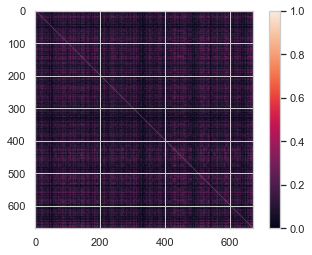

In [39]:
plt.imshow(matrizss);
plt.colorbar()
plt.show()


### ECUACIONES RATING
***

Cada rating se multiplica por el factor de similitud de usuario que dio el rating. La 

predicción final por usuario será igual a 

la suma del peso de los ratings dividido por la “suma ponderada”



$$ R_u =\frac{\sum_{u=1}^{n}R_u \cdot S_u}{\sum_{u=1}^{n}S_u}$$

donde:


$R_u$ corresponde al ranking

$ S_u $ es la similitud




In [40]:
#Recomendación hecha para el usuario user_id 28 en base a lo que vio con anterioridad
recomendacion


,film,puntaje
9,Terminator 3: Rise of the Machines,2.130478
8,Солярис,1.771090
7,Men in Black II,1.625062
6,Monsoon Wedding,1.534982
5,The Hours,1.284728
4,Batman Returns,1.212631
3,The Conversation,1.166411
2,License to Wed,1.123100
1,Bridge to Terabithia,1.100227
0,Rain Man,1.079354


In [41]:
#Lo que vio con anterioridad
base_dato_usuario[base_dato_usuario['user_id']==28]


,user_id,id,rating_5,original_title
5415,28,913,4.0,The Thomas Crown Affair
8140,28,1250,5.0,Ghost Rider
8492,28,345,5.0,Eyes Wide Shut
8792,28,924,4.0,Dawn of the Dead
11325,28,920,5.0,Cars
11391,28,926,5.0,Galaxy Quest
11431,28,953,2.0,Madagascar
12433,28,1831,1.0,The Next Best Thing
12458,28,1883,4.0,Malcolm X
12601,28,1956,4.0,Gerry


### Error de validación

In [42]:
resumen


,mae,mse,rmse,mape,maape,wmape,mmape,smape,etapa
0,3.0338,10.2749,3.2054,0.8432,0.6945,0.8502,0.6468,1.4982,entrenamiento
0,2.8263,9.1964,3.0326,0.8172,0.6743,0.8246,0.6201,1.4474,prueba


<h1 align="center">Filtro Colaborativo Basado en Item</h1> 

***  

***
### Metodología
1. Crear matriz items que califico usuario / Rating
2. Dividir en Conjunto de entrenamiento y prueba
3. Matriz de Similitud: Distancias por Coseno
4. calcular Rating a partir de matriz de similitud- Predicciones
5. validación del error


In [43]:
df_matrix.head(10)

original_title,10 Things I Hate About You,12 Angry Men,1408,15 Minutes,16 Blocks,"20,000 Leagues Under the Sea",2001: A Space Odyssey,2046,21 Grams,25th Hour,28 Days Later,28 Weeks Later,300,"4 luni, 3 săptămîni și 2 zile",40 Days and 40 Nights,42nd Street,4: Rise of the Silver Surfer,5 Days of War,50 First Dates,54,8 Mile,8 femmes,88 Minutes,A Beautiful Mind,A Bridge Too Far,A Christmas Story,A Dangerous Method,A Few Good Men,A Hard Day's Night,A History of Violence,A Mighty Heart,A Nightmare on Elm Street,A Scanner Darkly,A Streetcar Named Desire,A Time to Kill,A View to a Kill,About Schmidt,About a Boy,Absolute Power,Across the Universe,Adaptation.,Airplane!,Alexander,Alien,Aliens,Aliens vs Predator: Requiem,Alive,All the King's Men,Almost Famous,Along Came Polly,Along Came a Spider,Alvin and the Chipmunks,Amadeus,American Beauty,American Graffiti,American History X,American Pie,American Pie 2,American Psycho,American Splendor,American Wedding,Amores perros,An Unfinished Life,Anchorman: The Legend of Ron Burgundy,Annie Hall,Antz,Apocalypse Now,Apollo 13,Arlington Road,Armageddon,Army of Darkness,As Good as It Gets,Astérix aux Jeux Olympiques,Atonement,Austin Powers in Goldmember,Austin Powers: International Man of Mystery,Babel,Back to the Future,Back to the Future Part II,Back to the Future Part III,Bad Boys II,Bandidas,Barry Lyndon,Basic Instinct 2,Basquiat,Batman,Batman & Robin,Batman Begins,Batman Forever,Batman Returns,Beavis and Butt-Head Do America,Because I Said So,Becoming Jane,Bedazzled,Beetlejuice,Before Sunrise,Before Sunset,Being John Malkovich,Bend It Like Beckham,Beowulf,Beverly Hills Cop II,Beverly Hills Cop III,Big,Big Fish,Big Trouble in Little China,Bill & Ted's Bogus Journey,Bill & Ted's Excellent Adventure,Billy Elliot,Birthday Girl,Black Rain,Blade Runner,Blindness,Blood Diamond,Blow,Blue Like Jazz,Bogus,Boogeyman,Boogie Nights,Borat: Cultural Learnings of America for Make Benefit Glorious Nation of Kazakhstan,Bowling for Columbine,Boyz n the Hood,Brazil,Breakdown,Bridesmaids,Bridge to Terabithia,Brigham City,Bring It On,Brother,Brothers,C'era una volta il West,Cape Fear,Captain America: The First Avenger,Captain Corelli's Mandolin,Carriers,Cars,Cars 2,Casablanca,Casino,Casper,Cat on a Hot Tin Roof,Catch Me If You Can,Catch a Fire,Catwoman,Changeling,Changing Lanes,Charlie Wilson's War,Charlie and the Chocolate Factory,Charlie's Angels,Chasing Amy,Chill Factor,Chocolat,Cinderella Man,Clerks,Clerks II,Close Encounters of the Third Kind,Closer,Code 46,Cold Mountain,Con Air,Confessions of a Dangerous Mind,Conquest of the Planet of the Apes,Contraband,Cool Runnings,Cop Land,Copying Beethoven,Corpse Bride,Crank,Crash,Crimson Tide,Cube,Cutthroat Island,D.E.B.S.,Damnation Alley,Dancer in the Dark,Dances with Wolves,Dark Blue,Das Boot,Das Leben der Anderen,Dave Chappelle's Block Party,Dawn of the Dead,Days of Thunder,De jurk,Dead Man Walking,Dead Poets Society,Dear Frankie,Deconstructing Harry,Deep Blue Sea,Deep Impact,Der Untergang,Derailed,Deux frères,Diamonds Are Forever,Die Büchse der Pandora,Die Hard,Die Hard 2,Die Hard: With a Vengeance,Disclosure,Doctor Zhivago,Dogtown and Z-Boys,Don Juan DeMarco,Donnie Darko,Doom,Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb,Dracula,DragonHeart,Dragonslayer,Dreamgirls,"Dude, Where’s My Car?",Dune,Eastern Promises,Ed Wood,Edward Scissorhands,El Crimen del Padre Amaro,El laberinto del fauno,El orfanato,Elizabeth,Enchanted,Enough,Entrapment,Equilibrium,Eragon,Escape from New York,Escape from the Planet of the Apes,Eternal Sunshine of the Spotless Mind,Everybody's Fine,Evil Dead II,Executive Decision,Eyes Wide Shut,Face/Off,Fahrenheit 9/11,Failure to Launch,Family Plot,Fantasia,Fear and Loathing in Las Vegas,Festen,Fight Club,Final Fantasy: The Spirits Within,Finding Forrester,Finding Nemo,Finding Neverland,Flags of Our Fathers,Flash Gordon,Flashdance,Flirting with Disaster,Foodfight!,Footloose,Forrest Gump,Four Rooms,Freddy vs. Jason,Freedom Writers

In [44]:
#Recomendación para el usuario 28 a partir de que ve 'Batman'

recom,ero=filtro_colaborativo_item(df_matrix,base_dato_usuario,28,'Batman',10)


In [45]:
recom[:10]


,film,puntaje
683,Midnight Cowboy,0.564355
682,From Dusk Till Dawn,0.535918
681,Equilibrium,0.434121
680,Sense and Sensibility,0.408913
679,It Happened One Night,0.303481
678,Runaway Bride,0.302849
677,Pirates of the Caribbean: Dead Man's Chest,0.297201
676,Mambo Italiano,0.296755
675,GoodFellas,0.289523
674,Hulk,0.285554


In [46]:
ero

,mae,mse,rmse,mape,maape,wmape,mmape,smape,etapa
0,2.8516,9.4600,3.0757,0.7891,0.6563,0.8073,0.6060,1.3543,entrenamiento
0,2.8573,9.5436,3.0893,0.7863,0.6544,0.8051,0.6043,1.3484,prueba


<h1 align="center">Conclusiones</h1> 

***  

<p align="center">
 
<img src="imagenes\ventajas_desventajas.jpeg" width="800" height="700">
 
</p>


<h1 align="center">Proyecto Final</h1> 


##### Nombres:  
 Andrés Montecinos
     
 Pedro Paillalef 

##### Curso:  
 Aplicaciones Matemáticas en Ingenieria
